### LINKS
1. Github : [tamtemtomm/ABC_Inverted_Pendulum](https://github.com/tamtemtomm/ABC_Inverted_Pendulum)
2. Docs : [link](https://docs.google.com/document/d/174hLBzZ7mOxOqOj72eF2gXPY5-DPfjZsS4wJBY1b4Ow/edit?tab=t.0)
3. You can also look to colab version here : [link](https://colab.research.google.com/drive/1l8WH71j43StW5f43IY9zYmzAwvvKT4El#scrollTo=TqHi_iAoN0IP)

## Import dependencies

In [1]:
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import display, HTML

import scipy
from scipy.integrate import solve_ivp
from sympy import symbols, Function, sin, cos, diff, init_printing, Eq, ratsimp, simplify, solve, Subs

# Inverted Pendulum using LQR and Artificial Bee Colony (ABC)
<p style={{textAlign='justify'}}> Here below is the illustration of the problem. Given a cart that has a mass of (<strong>M</strong>) and a pendulum that has a weight of (<strong>m</strong>). Simulate the cart pendulum movement if the cart using Linear Quadratic Operator with Artificial Bee Colony Optimization.

In [ ]:
# @title <p> Problem Illustration
from IPython.display import display, HTML

# Use HTML to center the image
html_code = """
<div style="text-align: center;">
    <img src="https://cdn.prod.website-files.com/625ec4bbe44f3510b4f59aaf/629f95ba2e4ec02eebff274f_01.jpg" alt="Centered Image">
</div>
"""
display(HTML(html_code))

## Inverted Pendulum Equation Derivation
Here we derive the equation of motion from the problem above. You could follow along on how we derive this equation and get the $A$ and $B$ mat drrix for further implementation. We also provide the code on maxima if you prefer to use it. But feel free to skip this part if you already familiar about how to linearize the inverted pendulum equation.

Long story short from the below calculations, it can be concluded that the matrix $A$ of the system is:

\[
\begin{array}{ccc}
0 & 1 & 0 & 0 \\
0 & \frac{d}{m_{pendulum}} & \frac{g * m_{pendulum}}{m_{pendulum}} & 0 \\
0 & \frac{d}{m_{pendulum . L}} & \frac{g . (m_{pendulum} + M_{cart})}{m_{pendulum}L} & 0 \\
0 & 0 & 0 & 1 \\
\end{array}
\]

and matrix $B$ for system is :
\[
\begin{vmatrix}
0 \\
\frac{-1}{m_{pendulum}} \\
\frac{1}{m_{pendulum} . L}  \\
0 \\
\end{vmatrix}
\]

In [ ]:
# @title <p> Initialize sympy
from sympy import symbols, Function, sin, cos, diff, init_printing, Eq, ratsimp, simplify, solve, Subs

# Initialize pretty printing
init_printing()

### Declare the independent variable

<p>This problem can be simulated using two variable, the first one is $x(t)$ to define the current distance of the cart along the x-axis. The second one is theta $θ(t)$ to define the current rotational angle of the pendulum.
 </p>

In [ ]:
# @title <p> Sympy
t = symbols('t')  # time (s)
g = symbols('g')  # Gravity (m/s^2)
L = symbols('L')  # Length of the pendulum (m)
d = symbols('d')  # Frictions Coefficient (N/m)
F = symbols('F')  # Force (N)
m_pendulum = symbols('m_pendulum') # Mass of pendulum (Kg)
M_cart = symbols('M_cart') # Mass of cart (Kg)

# Declare dependent variables as functions of t
x = Function('x')(t)
θ = Function('θ')(t)

# Display results
x, θ

(x(t), θ(t))

Maxima

```
/* Definisikan variabel */
kill(all);
depends(x, t); depends(θ, t);
```

### Initialize the positions and movements

$x_{\text{pendulum}}$ defines the horizontal position of the pendulum's tip,  calculated as the sum of the cart's position $x(t)$ and the horizontal displacement of the pendulum based on its angle $\theta(t)$:  
$$
x_{\text{pendulum}} = x(t) + L \sin(\theta(t))
$$  

$y_{\text{pendulum}}$ defines the vertical position of the pendulum's tip,  calculated using the pendulum's length $L$ and its angle $\theta(t)$:  
$$
y_{\text{pendulum}} = L \cos(\theta(t))
$$  

The velocities of the pendulum are described by their components:  

$v_{x\text{pendulum}}$ defines the horizontal velocity of the pendulum's tip,  derived by differentiating $x_{\text{pendulum}}$ with respect to time:  
$$
v_{x\text{pendulum}} = \frac{d}{dt} \left( x(t) + L \sin(\theta(t)) \right)
$$  

$v_{y\text{pendulum}}$ defines the vertical velocity of the pendulum's tip,  derived by differentiating $y_{\text{pendulum}}$ with respect to time:  
$$
v_{y\text{pendulum}} = \frac{d}{dt} \left( L \cos(\theta(t)) \right)
$$


In [ ]:
# @title <p> Sympy
x_pendulum = x + L * sin(θ)
y_pendulum = L * cos(θ)

# Compute velocity components
vx_pendulum = diff(x_pendulum, t)
vy_pendulum = diff(y_pendulum, t)

# Display equations in the form variable = expression
eq_x_pendulum = Eq(symbols('x_pendulum'), x_pendulum)
eq_y_pendulum = Eq(symbols('y_pendulum'), y_pendulum)
eq_vx_pendulum = Eq(symbols('vx_pendulum'), vx_pendulum)
eq_vy_pendulum = Eq(symbols('vy_pendulum'), vy_pendulum)

# Display the expressions
display(Eq(symbols('x_pendulum'), x_pendulum))
display(Eq(symbols('y_pendulum'), y_pendulum))
display(Eq(symbols('vx_pendulum'), vx_pendulum))
display(Eq(symbols('vy_pendulum'), vy_pendulum))

x_pendulum = L⋅sin(θ(t)) + x(t)

y_pendulum = L⋅cos(θ(t))

                          d          d       
vx_pendulum = L⋅cos(θ(t))⋅──(θ(t)) + ──(x(t))
                          dt         dt      

                           d       
vy_pendulum = -L⋅sin(θ(t))⋅──(θ(t))
                           dt      

Maxima

```
/* Definisikan koordinat pendulum */
x_pendulum: x + L*sin(θ); y_pendulum: L*cos(θ);
vx_pendulum: diff(x_pendulum, t); vy_pendulum: diff(y_pendulum, t);
```

### Calculating kinetic energy

$T_{\text{pendulum}}$ defines the kinetic energy of the pendulum,
calculated using its mass $m_{\text{pendulum}}$ and the velocities $v_{x,\text{pendulum}}$ and $v_{y,\text{pendulum}}$ of the pendulum's tip:

$$
T_{\text{pendulum}} = \frac{1}{2} m_{\text{pendulum}} \left( v_{x,\text{pendulum}}^2 + v_{y,\text{pendulum}}^2 \right)
$$


$T_{\text{cart}}$ defines the kinetic energy of the cart,
calculated using its mass $M_{\text{cart}}$ and the velocity of the cart $\frac{dx}{dt}$:

$$
T_{\text{cart}} = \frac{1}{2} M_{\text{cart}} \left( \frac{d}{dt} x \right)^2
$$


The total kinetic energy $T$ is the sum of the kinetic energies of the pendulum and the cart:

$$
T = T_{\text{pendulum}} + T_{\text{cart}}
$$

In [ ]:
# @title <p> Sympy
T_pendulum = (1/2) * m_pendulum * (vx_pendulum**2 + vy_pendulum**2)
T_cart = (1/2) * M_cart * (diff(x, t)**2)

# Total kinetic energy
T = T_pendulum + T_cart

# Display equations in the form variable = expression
eq_T_pendulum = Eq(symbols('T_pendulum'), T_pendulum)
eq_T_cart = Eq(symbols('T_cart'), T_cart)
eq_T = Eq(symbols('T'), T)

# Display the expressions
display(Eq(symbols('T_pendulum'), T_pendulum))
display(Eq(symbols('T_cart'), T_cart))
display(Eq(symbols('T'), T))

                            ⎛                        2                                    2⎞
                            ⎜ 2    2       ⎛d       ⎞    ⎛            d          d       ⎞ ⎟
T_pendulum = 0.5⋅m_pendulum⋅⎜L ⋅sin (θ(t))⋅⎜──(θ(t))⎟  + ⎜L⋅cos(θ(t))⋅──(θ(t)) + ──(x(t))⎟ ⎟
                            ⎝              ⎝dt      ⎠    ⎝            dt         dt      ⎠ ⎠

                              2
                    ⎛d       ⎞ 
T_cart = 0.5⋅M_cart⋅⎜──(x(t))⎟ 
                    ⎝dt      ⎠ 

                         2                  ⎛                        2                             ↪
               ⎛d       ⎞                   ⎜ 2    2       ⎛d       ⎞    ⎛            d          d ↪
T = 0.5⋅M_cart⋅⎜──(x(t))⎟  + 0.5⋅m_pendulum⋅⎜L ⋅sin (θ(t))⋅⎜──(θ(t))⎟  + ⎜L⋅cos(θ(t))⋅──(θ(t)) + ─ ↪
               ⎝dt      ⎠                   ⎝              ⎝dt      ⎠    ⎝            dt         d ↪

↪         2⎞
↪        ⎞ ⎟
↪ ─(x(t))⎟ ⎟
↪ t      ⎠ ⎠

Maxima

```
/* Definisikan energi kinetik */
T_pendulum: (1/2)*m_pendulum*(vx_pendulum^2 + vy_pendulum^2);
T_cart: (1/2)*M_cart*(diff(x,t))^2;              
T: T_pendulum + T_cart;      
```

### Calculating potential energy

$V$ defines the potential energy of the pendulum since we don't have the potential energy of the cart, calculated using the mass of the pendulum ($m_{\text{pendulum}}$), gravitational acceleration ($g$), and the vertical position of the pendulum's tip ($y_{\text{pendulum}}$):

$$
V = m_{\text{pendulum}}.g.y_{\text{pendulum}}
$$

Where $y_{\text{pendulum}}$ is defined as the vertical position of the pendulum's tip,

In [ ]:
# @title <p> Sympy
V = m_pendulum * g * y_pendulum

V

L⋅g⋅m_pendulum⋅cos(θ(t))

Maxima

```
/* Definisikan energi potensial */
V: m_pendulum*g*y_pendulum; /* Energi potensial pendulum */   
```

### Lagrangian Equation

The Lagrangian ( $L$ ) is defined as the difference between the total kinetic energy ( $T$ ) and the potential energy ( $V$ ) of the system:

$$
L = T - V
$$

The Lagrange's Equations describe the dynamics of the system. These equations are derived by applying the principle of least action to the Lagrangian:

1. Lagrange's Equation 1 ( $x(t)$, the horizontal displacement of the cart)
This equation describes the motion of the cart, including damping force and an external force ( $F$ ) acting on the cart. It is derived by differentiating the Lagrangian with respect to $x(t)$ and its velocity $\frac{dx}{dt}$ :
$$
\frac{d}{dt} (\frac{dL}{dx'}) - (\frac{dL}{dx}) - d (\frac{dx}{dt}) = F
$$
Where :
  - $x'$ = $\frac{dx}{dt}$ is the velocity of the cart.
  - $d$ is the coefficient of friction, and $F$ is the external force acting on the cart.

2.  Lagrange's Equation 1 ( $θ(t)$,  the angle of the pendulum).This equation governs the motion of the pendulum and is derived by differentiating the Lagrangian with respect to $θ(t)$ and its velocity $\frac{dθ}{dt}$ :
$$
\frac{d}{dt} (\frac{dθ'}{dt}) - (\frac{dL}{dθ}) = 0
$$
Where :
  - $dθ'$ = $\frac{dθ}{dt}$ is the angular velocity of the pendulum.
  - $d$ This equation is set to zero as no external forces or damping are acting on the pendulum.

In [ ]:
# @title <p> Sympy

# Lagrangian (L = T - V)
Lagrangian = T - V

# Lagrange's Equation 1 (for x)
lagrange_eqn1 = ratsimp(diff(diff(Lagrangian, diff(x, t)), t) - diff(Lagrangian, x)) - d * diff(x, t) - F

# Lagrange's Equation 2 (for θ)
lagrange_eqn2 = ratsimp(diff(diff(Lagrangian, diff(θ, t)), t) - diff(Lagrangian, θ))

# Display equations in the form variable = expression
eq_Lagrangian = Eq(symbols('Lagrangian'), Lagrangian)
eq_lagrange_eqn1 = Eq(symbols('lagrange_eqn1'), lagrange_eqn1)
eq_lagrange_eqn2 = Eq(symbols('lagrange_eqn2'), lagrange_eqn2)

display(Eq(symbols('Lagrangian'), Lagrangian))
display(Eq(symbols('lagrange_eqn1'), lagrange_eqn1))
display(Eq(symbols('lagrange_eqn2'), lagrange_eqn2))

                                                              2                  ⎛                 ↪
                                                    ⎛d       ⎞                   ⎜ 2    2       ⎛d ↪
Lagrangian = -L⋅g⋅m_pendulum⋅cos(θ(t)) + 0.5⋅M_cart⋅⎜──(x(t))⎟  + 0.5⋅m_pendulum⋅⎜L ⋅sin (θ(t))⋅⎜─ ↪
                                                    ⎝dt      ⎠                   ⎝              ⎝d ↪

↪         2                                    2⎞
↪        ⎞    ⎛            d          d       ⎞ ⎟
↪ ─(θ(t))⎟  + ⎜L⋅cos(θ(t))⋅──(θ(t)) + ──(x(t))⎟ ⎟
↪ t      ⎠    ⎝            dt         dt      ⎠ ⎠

                                                          2                               2        ↪
                                                ⎛d       ⎞                               d         ↪
lagrange_eqn1 = -F - 1.0⋅L⋅m_pendulum⋅sin(θ(t))⋅⎜──(θ(t))⎟  + 1.0⋅L⋅m_pendulum⋅cos(θ(t))⋅───(θ(t)) ↪
                                                ⎝dt      ⎠                                 2       ↪
                                                                                         dt        ↪

↪                2                                       2       
↪               d             d                         d        
↪  + 1.0⋅M_cart⋅───(x(t)) - d⋅──(x(t)) + 1.0⋅m_pendulum⋅───(x(t))
↪                 2           dt                          2      
↪               dt                                      dt       

                                              2                                        2           ↪
                     2               2       d                2               2       d            ↪
lagrange_eqn2 = 1.0⋅L ⋅m_pendulum⋅sin (θ(t))⋅───(θ(t)) + 1.0⋅L ⋅m_pendulum⋅cos (θ(t))⋅───(θ(t)) -  ↪
                                               2                                        2          ↪
                                             dt                                       dt           ↪

↪                                                            2       
↪                                                           d        
↪ 1.0⋅L⋅g⋅m_pendulum⋅sin(θ(t)) + 1.0⋅L⋅m_pendulum⋅cos(θ(t))⋅───(x(t))
↪                                                             2      
↪                                                           dt       

Maxima

```
/* Definisikan Lagrangian */
Lagrangian: T - V;

/* Hitung persamaan gerak menggunakan Lagrange (d adalah koefisien gaya gesek)*/
lagrange_eqn1: ratsimp(diff(diff(Lagrangian, diff(x,t)), t) - diff(Lagrangian, x))  - d*diff(x, t)= F;
lagrange_eqn2: ratsimp(diff(diff(Lagrangian, diff(θ,t)), t) - diff(Lagrangian, θ)) = 0;
```

### Simplify the equation

To linearize the system for small angles ($θ$ is very small), the following approximations are used:

  1.   $sin(θ) ~ θ$
  2.   $cos(θ) ~ 1$
  3.   Higher-order terms ($θ^{2}$, $θ^{3}$) are ignored.
  4.   The square of the angular velocity ($\frac{dθ}{dt}^2$)



####Sympy

In [ ]:
# @title <p> Simplifications (assume θ is very small)
simplifications = {
    sin(θ): θ,       # sin(θ) ≈ θ
    cos(θ): 1,       # cos(θ) ≈ 1
    θ**2: 0,         # θ^2 ≈ 0
    θ**3: 0,         # θ^3 ≈ 0
    diff(θ, t)**2: 0 ,   # diff(θ, t)**2: ≈ 0
}

In [ ]:
# @title <p> Solve Lagrange Equation 1
# Solve Lagrange Equation 1 for ẍ (x_ddot)
derive_xddot_1 = solve(lagrange_eqn1, diff(x, t, t))[0]  # Extract the first solution
derive_xddot_1_simplified = simplify(derive_xddot_1.subs(simplifications))

# Solve Lagrange Equation 1 for θ̈ (theta_ddot)
derive_thetaddot_1 = solve(lagrange_eqn1, diff(θ, t, t))[0]  # Extract the first solution
derive_thetaddot_1_simplified = simplify(derive_thetaddot_1.subs(simplifications))

# Display results
derive_xddot_1_simplified, derive_thetaddot_1_simplified

⎛                  2                                  2                                   2       ⎞
⎜                 d             d                    d             d                     d        ⎟
⎜F - L⋅m_pendulum⋅───(θ(t)) + d⋅──(x(t))  F - M_cart⋅───(x(t)) + d⋅──(x(t)) - m_pendulum⋅───(x(t))⎟
⎜                   2           dt                     2           dt                      2      ⎟
⎜                 dt                                 dt                                  dt       ⎟
⎜───────────────────────────────────────, ────────────────────────────────────────────────────────⎟
⎝          M_cart + m_pendulum                                  L⋅m_pendulum                      ⎠

In [ ]:
# @title <p> Solve Lagrange Equation 2
# Solve Lagrange Equation 2 for ẍ (x_ddot)
derive_xddot_2 = solve(lagrange_eqn2, diff(x, t, 2))[0]  # Extract the first solution
derive_xddot_2_simplified = simplify(derive_xddot_2.subs(simplifications))

# Solve Lagrange Equation 2 for θ̈ (theta_ddot)
derive_thetaddot_2 = solve(lagrange_eqn2, diff(θ, t, t))[0]  # Extract the first solution
derive_thetaddot_2_simplified = simplify(derive_thetaddot_2.subs(simplifications))

derive_xddot_2_simplified, derive_thetaddot_2_simplified

⎛                                       2       ⎞
⎜                                      d        ⎟
⎜                             g⋅θ(t) - ───(x(t))⎟
⎜     2                                  2      ⎟
⎜    d                                 dt       ⎟
⎜- L⋅───(θ(t)) + g⋅tan(θ(t)), ──────────────────⎟
⎜      2                              L         ⎟
⎝    dt                                         ⎠

In [ ]:
# @title <p> Get the final equation
# Solve for theta_ddot (θ̈) by substituting derive_thetaddot_2 into derive_xddot_1
x_ddot_final = solve(simplify(derive_xddot_1_simplified.subs({diff(θ, t, t): derive_thetaddot_2_simplified})), diff(x, t, t))[0]

# Solve for theta_ddot (θ̈) by substituting derive_thetaddot_2 into derive_xddot_1
theta_ddot_final = solve(simplify(derive_thetaddot_2_simplified.subs({diff(x, t, t): derive_xddot_1_simplified})), diff(θ, t, t))[0]

x_ddot_final, theta_ddot_final

⎛       d                                                   d                           ⎞
⎜-F - d⋅──(x(t)) + g⋅m_pendulum⋅θ(t)  F - M_cart⋅g⋅θ(t) + d⋅──(x(t)) - g⋅m_pendulum⋅θ(t)⎟
⎜       dt                                                  dt                          ⎟
⎜───────────────────────────────────, ──────────────────────────────────────────────────⎟
⎝            m_pendulum                                  L⋅m_pendulum                   ⎠

#### Maxima

```
/* Buat persamaan sin dan cos untuk penyerdahanaan */
/* Asumsikan nilai theta sangat kecil */
simp_sin: sin(θ)=θ; simp_cos: cos(θ)=1;
simp_theta_1: θ^2 = 0; simp_theta_2: θ^3 = 0; simp_theta_3: diff(θ, t) = 0;

/* Turunkan persamaan lagrange 1 terhadap x dan theta */
derive_thetaddot_1: subst([simp_sin, simp_cos, simp_theta_1, simp_theta_2, simp_theta_3], solve(lagrange_eqn1, diff(θ, t, 2)));
derive_xddot_1: subst([simp_sin, simp_cos, simp_theta_1, simp_theta_2, simp_theta_3], solve(lagrange_eqn1, diff(x, t, 2)));

/* Turunkan persamaan lagrange 2 terhadap x dan theta */
derive_thetaddot_2: subst([simp_sin, simp_cos, simp_theta_1, simp_theta_2, simp_theta_3], solve(lagrange_eqn2, diff(θ, t, 2)));
derive_xddot_2: subst([simp_sin, simp_cos, simp_theta_1, simp_theta_2, simp_theta_3], solve(lagrange_eqn2, diff(x, t, 2)));

/* Turunkan persaaman xddot dan thetaddot */
thetaddot: solve(subst(derive_xddot_1, derive_thetaddot_2), diff(θ, t, 2));
xddot: solve(subst(derive_thetaddot_2, derive_xddot_1), diff(x, t, 2));
```

### Matriks A dan B


From the above calculations, it can be concluded that the matrix $A$ of the system is:

\[
\begin{array}{ccc}
0 & 1 & 0 & 0 \\
0 & \frac{d}{m_{pendulum}} & \frac{g * m_{pendulum}}{m_{pendulum}} & 0 \\
0 & \frac{d}{m_{pendulum . L}} & \frac{g . (m_{pendulum} + M_{cart})}{m_{pendulum}L} & 0 \\
0 & 0 & 0 & 1 \\
\end{array}
\]

and matrix $B$ for system is :
\[
\begin{vmatrix}
0 \\
\frac{-1}{m_{pendulum}} \\
\frac{1}{m_{pendulum} . L}  \\
0 \\
\end{vmatrix}
\]


### Python implementation
Here we make a function to initialize $A$ and $B$ matrices.

In [ ]:
# @title <p> A and B matrices
def system_matrices(
    m: float = 0.1,
    M: float = 1.0,
    L: float = 1.0,
    g: float = 9.81,
    d: float = 0.1,
  ):

  A = np.array([
      [0, 1, 0, 0],
      [0, -d/m, -m*g/m, 0],
      [0, 0, 0, 1],
      [0, d/(m*L), (m+M)*g/(m*L), 0]
  ])
  B = np.array([[0], [-1/m], [0], [1/(m*L)]])

  return A, B

## LQR Control

### Cost Function

The cost function $J$ is defined as:

$$
J = \int_{0}^{∞} (x(t)^T Qx(t) + u(t)^TRu(t))
$$

where :
- $x(t)$ : State vector
- $u(t)$ : Control input
- $Q$ :  State-weighting matrix ($n$ x $n$, penalizes deviations in the state), this matrices later will be optimized using ABC
- $R$ :  Input-weighting matrix ($m$ x $m$, penalizes control effort), this matrices later will be optimized using ABC



In [ ]:
def cost (
    x:np.ndarray,
    u:np.ndarray,
    Q:np.ndarray,
    R:np.ndarray
  ):
  cost = x.T @ Q @ x + u.T @ R @ u
  return cost

### Control Flow
In LQR, we can find optimal control flow by :

$$
u(t) = - K(x)t
$$

Where $K$ is the feedback gain matrix given by :

$$
K = R^{-1}B^TP
$$

Where :
- $P$ : Symmetric positive-definite matrix that satisfies the algebraic Riccati equation.

In [ ]:
# @title <p> Gain implementation
def gain(
    R:np.ndarray,
    B:np.ndarray,
    P:np.ndarray
  ):

  K = np.linalg.inv(R) @ B.T @ P
  return K

### Algebraic Riccati Equation
The matrix $P$ is found by solving the algebraic Riccati equation:

$$
A^TP + PA - PBR^{-1}B^TP + Q = 0
$$

This equation ensures that the control law $u(t) = - K(x)t$ minimizes the cost function $J$. In scipy we can calculate this using `scipy.linalg.solve_continuous_are`

In [ ]:
# @title <p> From scratch implementation, compute iteratively
def solve_riccati(
    A:np.ndarray,
    B:np.ndarray,
    Q:np.ndarray,
    R:np.ndarray,
    max_iter:int=1000,
    tol:float=1e-8
):
    """
    Solves the Discrete-time Algebraic Riccati Equation (DARE) iteratively.
    Args:
        A (ndarray): State matrix.
        B (ndarray): Input matrix.
        Q (ndarray): State cost matrix.
        R (ndarray): Input cost matrix.
        max_iter (int): Maximum number of iterations.
        tol (float): Tolerance for convergence.
    Returns:
        P (ndarray): Solution of the Riccati equation.
    """
    # Initialize P with Q
    P = np.copy(Q)

    for iteration in range(max_iter):
        # Compute the intermediate term: B.T @ P @ B
        BT_P_B = B.T @ P @ B

        # Compute the gain: (R + B.T @ P @ B)^(-1)
        gain = np.linalg.inv(R + BT_P_B)

        # Update P
        P_next = A.T @ P @ A - A.T @ P @ B @ gain @ B.T @ P @ A + Q

        # Check for convergence
        if np.linalg.norm(P_next - P, ord='fro') < tol:
            print(f"Converged after {iteration + 1} iterations")
            return P_next

        # Update P for the next iteration
        P = P_next

    print("Maximum iterations reached without convergence")
    return P

In [ ]:
# @title <p> Scipy implementation
def solve_riccati(
    A:np.ndarray,
    B:np.ndarray,
    Q:np.ndarray,
    R:np.ndarray,
  ):

  P = scipy.linalg.solve_continuous_are(A, B, Q, R)
  return P

### Full Implementation

In [2]:
# @title <p> Make it into class module
class LQR :
  def __init__(self):
    pass

  def _gain(self, R, B, P):

    # K = R^(-1).B.P
    K = np.linalg.inv(R) @ B.T @ P
    return K

  def _solve_riccati(self, A, B, Q, R):

    # A.P + P.A - P.B.R^(-1).B.P + Q = 0
    P = scipy.linalg.solve_continuous_are(A, B, Q, R)
    return P

  def solve_manual(
      self,
      A:np.ndarray,
      B:np.ndarray,
      Q:np.ndarray,
      R:np.ndarray,
      max_iter:int=1000,
      tol:float=1e-8
  ):
      # Initialize P with Q
      P = np.copy(Q)

      for iteration in range(max_iter):
          # Compute the intermediate term: B.T @ P @ B
          BT_P_B = B.T @ P @ B

          # Compute the gain: (R + B.T @ P @ B)^(-1)
          gain = np.linalg.inv(R + BT_P_B)

          # Update P
          P_next = A.T @ P @ A - A.T @ P @ B @ gain @ B.T @ P @ A + Q

          # Check for convergence
          if np.linalg.norm(P_next - P, ord='fro') < tol:
              print(f"Converged after {iteration + 1} iterations")
              return P_next

          # Update P for the next iteration
          P = P_next

      print("Maximum iterations reached without convergence")
      return P

  def solve(self, A, B, Q, R):
    P = self._solve_riccati(A, B, Q, R)
    K = self._gain(R, B, P)
    return K

  def cost(self, x, u, Q, R):
    cost = x.T @ Q @ x + u.T @ R @ u
    return cost

## Pendulum Dynamics

### Compute Control Input
Control input of the pendulum can be derived as :
$$
u(t) = -Kx(t) + f_{0}
$$

where :
- $u(t)$ = Feedback input
- $K$ = Gain (the one that we got from LQR)
- $x(t)$ = Input from previous $t$
- $F_{0} = Initial force

In [ ]:
# @title <p> Control input implementation
def control_input(K, x, force_0):
  u = -K @ x + force_0
  return u

### Compute Time Derivative
Calculates the time derivative of the state vector $(dx/dt)$ using the state-space equations :
$$
\dot{x} = Ax(t) + Bu(t)
$$

where both $A$ an $B$ is matrix that we get from equation of motion above

In [ ]:
# @title <p> Time Derivative Implementation
def time_derivative( A, B, x, u):
  dxdt = A @ x + B.flatten() * u
  return dxdt

### Pendulum Motion
Combining both of the function we got the pendulum motion function in particular $t$

In [ ]:
# @title <p> Pendulum motion implementation
def pendulum_dynamics(t, x, A, B, K, force_0):
    u = control_input(K, x, force_0)
    dxdt = time_derivative(A, B, x, u)
    return dxdt

### Pendulum motion simulation
We can iterate the process along $t$ time and $t_{sampling}$
Here the function will give `solution` as an output :
- `solution.t` : Array of time points where the solution is computed.
- `solution.y` : Array of the state vector $x$ at each time point in `t_eval`. For example :
  - `solution.y[0]` : Position of the cart $x$
  - `solution.y[1]` : Velocity of the cart $\dot{x}$
  - `solution.y[2]` : Angle of the pendulum $θ$
  - `solution.y[2]` : Angular velocity of the pendulum $\dot{θ}$

Here we can compute the process iteratively using `scipy.integrate.solve_ivp`

In [ ]:
from scipy.integrate import solve_ivp
def solve(t:float,
          t_sampling:float,
          A:np.ndarray,
          B:np.ndarray,
          Q:np.ndarray,
          R:np.ndarray,
          initial:np.ndarray,
          force_0:float,
          ):

  lqr = LQR()
  K = lqr.solve(A, B, Q, R)

  def pendulum_dynamics(t, x, A, B, K, force_0):
    u = control_input(K, x, force_0)
    dxdt = time_derivative(A, B, x, u)
    return dxdt

  # Simulasi sistem
  t_span = (0, t)  # Rentang waktu simulasi
  t_eval = np.linspace(t_span[0], t_span[1], t_sampling)  # Titik waktu evaluasi
  solution = solve_ivp(pendulum_dynamics, t_span, initial, t_eval=t_eval)
  return solution

### Inverted Pendulum Model
Finally we can make entire inverted pendulum model into one class
For now we are just gonna use the default $Q$ and $R$ (will be optimized later using ABC)

In [3]:
class InvertedPendulum:
  def __init__(self,
                m: float = 0.1,
                M: float = 1.0,
                L: float = 1.0,
                g: float = 9.81,
                d: float = 0.1,
                x_0: float = 0,
                theta_0: float = 0.1,
                force_0: float = 0,
                Q: np.ndarray = None,
                R: np.ndarray = None):

      self.m = m
      self.M = M
      self.L = L
      self.g = g
      self.d = d

      self.force_0 = force_0
      self.initial = np.array([x_0, 0, theta_0, 0])

      self.A, self.B = self._system_matrices(m, M, L, g, d)

      # Matriks cost untuk LQR
      self.Q = np.diag([10, 1, 10, 1]) if Q is None else Q
      self.R = np.array([[0.1]]) if R is None else R

  def _system_matrices(self, m, M, L, g, d ):

    A = np.array([
        [0, 1, 0, 0],
        [0, -d/m, -m*g/m, 0],
        [0, 0, 0, 1],
        [0, d/(m*L), (m+M)*g/(m*L), 0]
    ])
    B = np.array([[0], [-1/m], [0], [1/(m*L)]])

    return A, B

  def solve(
      self,
      t:float,
      t_sampling:float,
    ):

    lqr = LQR()
    K = lqr.solve(self.A, self.B, self.Q, self.R)
    del(lqr)

    def pendulum_dynamics(t, x):
      u = self._control_input(K, x, self.force_0)
      dxdt = self._time_derivative(self.A, self.B, x, u)
      return dxdt

    # Simulasi sistem
    t_span = (0, t)  # Rentang waktu simulasi
    t_eval = np.linspace(t_span[0], t_span[1], t_sampling)  # Titik waktu evaluasi
    solution = solve_ivp(pendulum_dynamics, t_span, self.initial, t_eval=t_eval)
    return solution

  def _control_input(self, K, x, force_0):
    u = -K @ x + force_0
    return u

  def _time_derivative(self, A, B, x, u):
    dxdt = A @ x + B.flatten() * u
    return dxdt

## Pendulum Demonstration

### Plot Simulation
For demonstration here we make a function to plot pendulum motion based on the solution

In [ ]:
# @title <p> Initialized pendulum
theta = 0.1
pendulum = InvertedPendulum(theta_0=theta)

t = 2
t_sampling = 500
solution = pendulum.solve(t, t_sampling)
solution

  message: The solver successfully reached the end of the integration interval.
  success: True
   status: 0
        t: [ 0.000e+00  4.008e-03 ...  1.996e+00  2.000e+00]
        y: [[ 0.000e+00  8.642e-04 ...  1.147e-03  1.132e-03]
            [ 0.000e+00  4.160e-01 ... -3.646e-03 -3.600e-03]
            [ 1.000e-01  9.921e-02 ...  1.319e-04  1.302e-04]
            [ 0.000e+00 -3.768e-01 ... -4.199e-04 -4.146e-04]]
      sol: None
 t_events: None
 y_events: None
     nfev: 266
     njev: 0
      nlu: 0

In [ ]:
# @title <p> Plot demonstration
import matplotlib.pyplot as plt
def plot(solution):

  # Plot hasil simulasi
  plt.figure(figsize=(8, 6))
  plt.subplot(2, 1, 1)
  plt.plot(solution.t, solution.y[0], label='Posisi Cart (x)')
  plt.plot(solution.t, solution.y[2], label='Sudut Pendulum (theta)')
  plt.xlabel('Waktu (s)')
  plt.ylabel('Posisi')
  plt.legend()
  plt.grid()

  plt.subplot(2, 1, 2)
  plt.plot(solution.t, solution.y[1], label='Kecepatan Cart (x_dot)')
  plt.plot(solution.t, solution.y[3], label='Kecepatan Sudut Pendulum (theta_dot)')
  plt.xlabel('Waktu (s)')
  plt.ylabel('Kecepatan')
  plt.legend()
  plt.grid()

  plt.suptitle("Simulasi Inverted Pendulum dengan LQR")
  plt.tight_layout()
  plt.show()

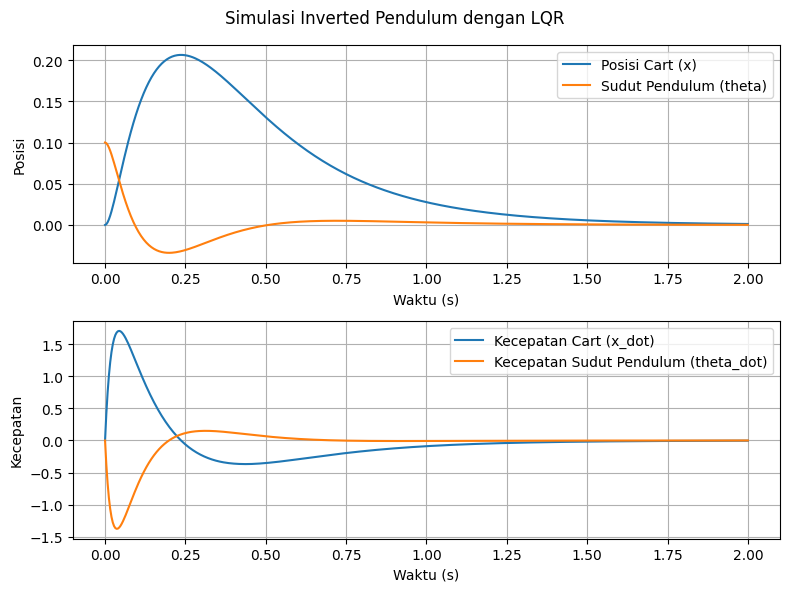

In [ ]:
plot(solution)

### Video Simulation

In [ ]:
# @title <p> Make simulation function
from IPython.display import HTML
from matplotlib.animation import FuncAnimation

def simulate(solution, L):
  # Membuat animasi dari simulasi
  fig, ax = plt.subplots(figsize=(8, 6))
  ax.set_xlim(-2, 2)
  ax.set_ylim(-1.5, 1.5)

  # Membuat objek cart (kotak di bawah tiang)
  cart = plt.Rectangle((-0.1, -0.05), 0.2, 0.1, color='blue')
  ax.add_patch(cart)

  # Membuat garis pendulum
  pendulum_line, = ax.plot([], [], lw=2, color='black')
  # Menggambar bola di ujung pendulum
  pendulum_ball = plt.Circle((0, 0), 0.05, color='red', fill=True)
  ax.add_patch(pendulum_ball)

  def update(frame):
      # Mengupdate posisi cart dan pendulum
      x = solution.y[0][frame]
      theta = solution.y[2][frame]

      # Mengupdate posisi cart
      cart.set_xy((x - 0.1, -0.05))

      # Posisi ujung pendulum (di mana bola harus menggantung)
      pendulum_x = x + L * np.sin(theta)
      pendulum_y = L * np.cos(theta)

      # Mengupdate posisi pendulum dan bola
      pendulum_line.set_data([x, pendulum_x], [0, pendulum_y])
      pendulum_ball.set_center((pendulum_x, pendulum_y))

      return cart, pendulum_line, pendulum_ball,

  # Mengatur animasi
  ani = FuncAnimation(fig, update, frames=len(solution.t), interval=20, blit=True)

  # Tampilkan animasi dalam format HTML
  plt.title("Simulasi Inverted Pendulum")
  plt.close(fig)
  return HTML(ani.to_jshtml())

In [ ]:
# @title <p> Simulate the pendulum
simulate(solution, pendulum.L)

### Make a simulation class

In [4]:
# @title <p> Simulation class
class Simulation :
  def __init__(self, solution):
    self.solution = solution

  def plot(self):

    # Plot hasil simulasi
    plt.figure(figsize=(8, 6))
    plt.subplot(2, 1, 1)
    plt.plot(self.solution.t, self.solution.y[0], label='Posisi Cart (x)')
    plt.plot(self.solution.t, self.solution.y[2], label='Sudut Pendulum (theta)')
    plt.xlabel('Waktu (s)')
    plt.ylabel('Posisi')
    plt.legend()
    plt.grid()

    plt.subplot(2, 1, 2)
    plt.plot(self.solution.t, self.solution.y[1], label='Kecepatan Cart (x_dot)')
    plt.plot(self.solution.t, self.solution.y[3], label='Kecepatan Sudut Pendulum (theta_dot)')
    plt.xlabel('Waktu (s)')
    plt.ylabel('Kecepatan')
    plt.legend()
    plt.grid()

    plt.suptitle("Simulasi Inverted Pendulum dengan LQR")
    plt.tight_layout()
    plt.show()

  def simulate(self, L):
    # Membuat animasi dari simulasi
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.set_xlim(-2, 2)
    ax.set_ylim(-1.5, 1.5)

    # Membuat objek cart (kotak di bawah tiang)
    cart = plt.Rectangle((-0.1, -0.05), 0.2, 0.1, color='blue')
    ax.add_patch(cart)

    # Membuat garis pendulum
    pendulum_line, = ax.plot([], [], lw=2, color='black')
    # Menggambar bola di ujung pendulum
    pendulum_ball = plt.Circle((0, 0), 0.05, color='red', fill=True)
    ax.add_patch(pendulum_ball)

    def update(frame):
        # Mengupdate posisi cart dan pendulum
        x = self.solution.y[0][frame]
        theta = self.solution.y[2][frame]

        # Mengupdate posisi cart
        cart.set_xy((x - 0.1, -0.05))

        # Posisi ujung pendulum (di mana bola harus menggantung)
        pendulum_x = x + L * np.sin(theta)
        pendulum_y = L * np.cos(theta)

        # Mengupdate posisi pendulum dan bola
        pendulum_line.set_data([x, pendulum_x], [0, pendulum_y])
        pendulum_ball.set_center((pendulum_x, pendulum_y))

        return cart, pendulum_line, pendulum_ball,

    # Mengatur animasi
    ani = FuncAnimation(fig, update, frames=len(self.solution.t), interval=20, blit=True)

    # Tampilkan animasi dalam format HTML
    plt.title("Simulasi Inverted Pendulum")
    plt.close(fig)
    return HTML(ani.to_jshtml())

## ABC Algorithm

### ABC

The Artificial Bee Colony (ABC) algorithm is a nature-inspired optimization algorithm that mimics the foraging behavior of honeybees. It was introduced by Dervis Karaboga in 2005 and is commonly used to solve numerical optimization problems, Here we would like to find an optimum $Q$ and $R$ matrices for the system.

The algorithm involves three types of bees:
1. Employed Bees: Search for food sources (solutions) and share information about their quality with onlooker bees.
2. Onlooker Bees: Choose food sources based on the information shared by employed bees.
3. Scout Bees: Explore new areas to find alternative food sources when existing ones are abandoned.
4. Each food source represents a possible solution to the optimization problem.

### Initialize Population
Randomly generate an initial population of food sources (solutions). Each food source is a vector:
$$
X_{i} = [x_{i1}, x_{i2}, x_{i3}, ..., x_{id}]
$$

where $d$ is the dimension of the solution space, and $i = 1, 2, 3, ... N_{s}$ (number of food sources)

In [ ]:
# @title <p> Initialize population impelementation
def _initialize_population(
    num_bees:int,
    dim : int,
    bounds : int,
  ):
    """
    Initialize the population of bees.

    Args:
        dim (int): Dimensionality of the search space.
        bounds (list of tuples): Bounds for each dimension.
    """
    population = np.random.uniform(
        low=[b[0] for b in bounds],
        high=[b[1] for b in bounds],
        size=(num_bees, dim)
    )
    return population

### Employed Bees Phase
Each employed bee modifies its current solution to find a neighboring solution:

$$
V_{ij} = X_{ij} + ϕ_{ij}(X_{ij} - X_{kj})
$$

where :
- $X_{ij}$ : Current solution component.
- $X_{kj}$ :  Randomly chosen solution component.
- ϕ_{ij} : Random number in $[−1,1]$

if $V_{ij}$ improves the fitness of objective function $f(V_{ij})$, it replaces $X_{ij}$

In [ ]:
# @title <p> Mutate solution implementation for later use
def _mutate_solution(solution, population, bounds):
    """
    Generate a new candidate solution by mutation.

    Args:
        solution (np.ndarray): Current solution.
        population (np.ndarray): Population of solutions.
        bounds (list of tuples): Bounds for each dimension.

    Returns:
        np.ndarray: Mutated solution.
    """
    phi = np.random.uniform(-1, 1, size=solution.shape)
    partner = population[np.random.randint(len(population))]
    candidate = solution + phi * (solution - partner)
    # Clip to bounds
    candidate = np.clip(candidate, [b[0] for b in bounds], [b[1] for b in bounds])
    return candidate

In [ ]:
# @title <p> Employed bees phase implementation
def employed_bees(
    population,
    objective_function,
    fitness,
    num_bees,
    bounds,
    trial, # Tracks the number of unsuccessful trials
  ):

  for i in range(num_bees):
      candidate = _mutate_solution(population[i], population, bounds)
      candidate_fitness = objective_function(candidate)
      if candidate_fitness < fitness[i]:
          population[i] = candidate
          fitness[i] = candidate_fitness
          trial[i] = 0
      else:
          trial[i] += 1

  return population, fitness, trial

### Onlooker Bee Phase
Onlooker bees select a food source based on a probability proportional to its fitness:

$$
\frac{f_{i}}{\sum_{j=1}^{N_{s}} f_j}
$$

where $f_i$ is the fitness value at $i$-th food source. Onlooker bees then exploit the chosen food sources similarly to the employed bees.

In [ ]:
# @title <p> Onlooker bees phase implementation
def onlooker_bees(
    population,
    objective_function,
    fitness,
    num_bees,
    bounds,
    trial, # Tracks the number of unsuccessful trials
  ):

  prob = fitness / fitness.sum()  # Probability selection based on fitness
  for i in range(num_bees):
      if np.random.rand() < prob[i]:
          candidate = _mutate_solution(population[i], population, bounds)
          candidate_fitness = objective_function(candidate)
          if candidate_fitness < fitness[i]:
              population[i] = candidate
              fitness[i] = candidate_fitness
              trial[i] = 0
          else:
              trial[i] += 1

  return population, fitness, trial

### Scout bees phase implementation
If a food source has not been improved for a predefined number of cycles (called the "limit"), it is abandoned. A scout bee randomly generates a new solution:

$$
X_{ij} = X_{_{min}j} + rand(0,1).(X_{_{max}j} - X_{_{min}j})
$$

where :
- $X_{_{min}j}$ and $X_{_{max}j}$ : Minimum and maximum bounds of the $j$-th dimension
- $rand(0,1)$ : Uniform random number between 0 and 1

In [ ]:
# @title <p> Scout bees phase implementation
def scout_bees(
    population,
    objective_function,
    fitness,
    num_bees,
    bounds,
    trial, # Tracks the number of unsuccessful trials
    limit #Abandonment limit for scout bees.
  ):

  # Scout bees phase
  for i in range(num_bees):
      if trial[i] >= limit:
          population[i] = _initialize_population(1, bounds)[0]
          fitness[i] = objective_function(population[i])
          trial[i] = 0

  return population, fitness, trial

### Optimize function
Here we make a full on complete ABC class from end to end

In [5]:
import numpy as np

class ABC:
  def __init__(self, objective_function, num_bees=30, max_iter=100, limit=10):

      self.objective_function = objective_function
      self.num_bees = num_bees
      self.max_iter = max_iter
      self.limit = limit
      self.solution = None  # Best solution found
      self.best_fitness = float('inf')  # Best fitness value

  def _initialize_population(self, dim, bounds):

    low = np.array([b[0] for b in bounds])
    high = np.array([b[1] for b in bounds])

    # Ensure low and high arrays have the same length as `dim`
    if len(low) != dim or len(high) != dim:
        raise ValueError("Bounds dimensionality must match `dim`.")

    # Generate random values within bounds for the entire population
    population = np.random.uniform(low=low, high=high, size=(self.num_bees, dim))
    return population

  def optimize(self, dim, bounds, verbose=False):

      print(f'dim={dim}, bounds={bounds}')

      population = self._initialize_population(dim, bounds)
      fitness = np.array([self.objective_function(ind) for ind in population])
      trial = np.zeros(self.num_bees)  # Tracks the number of unsuccessful trials

      for iteration in range(self.max_iter):

          population, fitness, trial = self._employed_bees(population, self.objective_function, fitness, self.num_bees, bounds, trial)

          population, fitness, trial = self._onlooker_bees(population, self.objective_function, fitness, self.num_bees, bounds, trial)

          population, fitness, trial = self._scout_bees(population, self.objective_function, fitness, self.num_bees, bounds, trial, self.limit)

          # Update best solution
          best_idx = np.argmin(fitness)
          if fitness[best_idx] < self.best_fitness:
              self.solution = population[best_idx]
              self.best_fitness = fitness[best_idx]

          if verbose :
            print('----------------------------------------------')
            print(f'Iteration {iteration + 1}')
            print(f'Best solution : {self.solution}')
            print(f'Best fitness : {self.best_fitness}')

            Q = np.diag(self.solution[:-1])
            R = np.array([[self.solution[-1]]])

            pendulum = InvertedPendulum(Q=Q, R=R)
            pendulum_solution = pendulum.solve(t=10, t_sampling=100)

            simulation = Simulation(pendulum_solution)
            simulation.plot()

            del(pendulum)
            del(simulation)


      return self.solution, self.best_fitness

  def _mutate_solution(self, solution, population, bounds):

      phi = np.random.uniform(-1, 1, size=solution.shape)
      partner = population[np.random.randint(len(population))]
      candidate = solution + phi * (solution - partner)
      # Clip to bounds
      candidate = np.clip(candidate, [b[0] for b in bounds], [b[1] for b in bounds])
      return candidate

  def _employed_bees(self, population, objective_function, fitness, num_bees, bounds, trial):

    for i in range(num_bees):
        candidate = self._mutate_solution(population[i], population, bounds)
        candidate_fitness = objective_function(candidate)
        if candidate_fitness < fitness[i]:
            population[i] = candidate
            fitness[i] = candidate_fitness
            trial[i] = 0
        else:
            trial[i] += 1

    return population, fitness, trial

  def _onlooker_bees(self, population, objective_function, fitness, num_bees, bounds, trial):

    prob = fitness / fitness.sum()  # Probability selection based on fitness
    for i in range(num_bees):
        if np.random.rand() < prob[i]:
            candidate = self._mutate_solution(population[i], population, bounds)
            candidate_fitness = objective_function(candidate)
            if candidate_fitness < fitness[i]:
                population[i] = candidate
                fitness[i] = candidate_fitness
                trial[i] = 0
            else:
                trial[i] += 1

    return population, fitness, trial

  def _scout_bees(self, population, objective_function, fitness, num_bees, bounds, trial, limit):

    for i in range(num_bees):
        if trial[i] >= limit:
            population[i] = self._initialize_population(1, bounds)[0]
            fitness[i] = objective_function(population[i])
            trial[i] = 0

    return population, fitness, trial

## ABC Optimization

### Designing objective function
There are many choices of designing objective function for ABC, but here we just want to minimalize the cost of LQR so here the steps :

For every iteration
1. Initialized bee population and make a Q and R matrices
3. Initialized pendulum instances with that matrices
4. Make a simulation on the pendulum
5. Calculate the cost
6. Make a new population on the bees and repeat

In [8]:
def objective_function(params):

  # print(f'Params : {params}')

  # Initialize Q and R
  Q = np.diag(params[:-1])
  R = np.array([[params[-1]]])

  # Initialize the pendulum
  pendulum = InvertedPendulum(Q=Q, R=R,
                              # m=0.1,
                              # M=1,
                              # L=1,
                              # g=9.81,
                              # d=0.1,
                              # x_0=0,
                              # theta_0 = 0,
                              # force_0 = 1
                              )

  # Solve for 10 seconds with 100 sampling points
  solution = pendulum.solve(t=10, t_sampling=100)

  # Calculate LQR cost J
  lqr = LQR()
  lqr_cost = 0
  for i in range(len(solution.t)):
      x_t = solution.y[:, i]
      u_t = -pendulum._control_input(lqr.solve(pendulum.A, pendulum.B, pendulum.Q, pendulum.R), x_t, pendulum.force_0)
      lqr_cost = lqr.cost(x_t, u_t, pendulum.Q, pendulum.R)
      # lqr_cost += x_t.T @ pendulum.Q @ x_t + u_t.T @ pendulum.R @ u_t

  del(pendulum)
  del(lqr)

  return lqr_cost

dim=5, bounds=[(0.1, 100), (0.1, 100), (0.1, 100), (0.1, 100), (0.1, 10)]
----------------------------------------------
Iteration 1
Best solution : [61.16200978  0.1        40.84322631 63.22685088  5.31995375]
Best fitness : 1.7322325866780164e-12


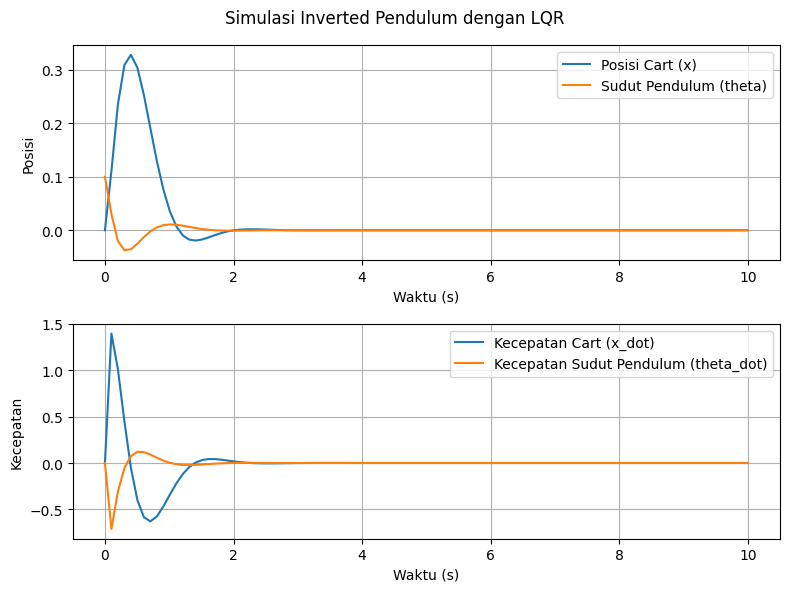

----------------------------------------------
Iteration 2
Best solution : [61.16200978  0.1        40.84322631 63.22685088  5.31995375]
Best fitness : 1.7322325866780164e-12


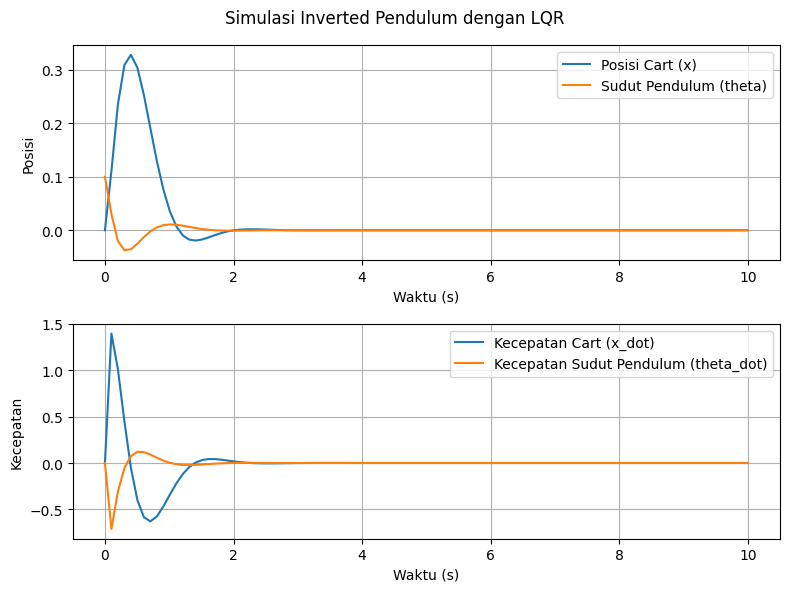

----------------------------------------------
Iteration 3
Best solution : [61.16200978  0.1        40.84322631 63.22685088  5.31995375]
Best fitness : 1.7322325866780164e-12


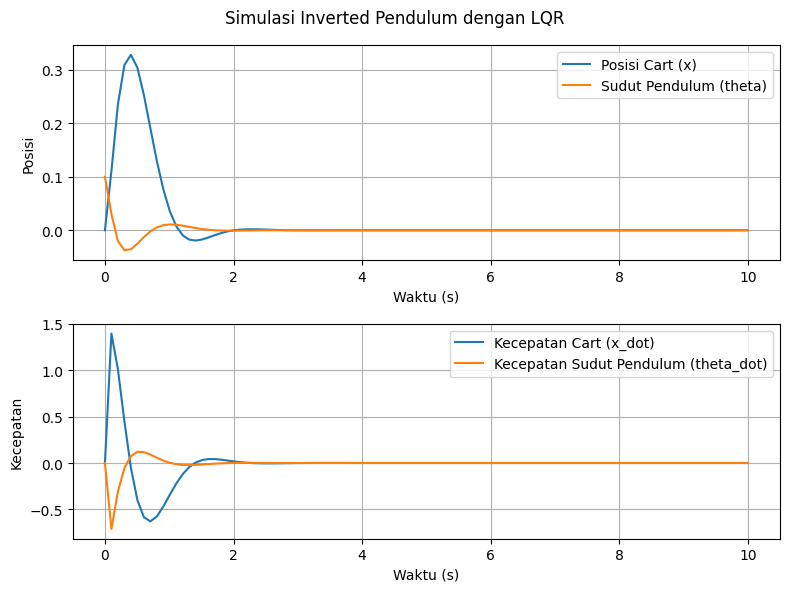

----------------------------------------------
Iteration 4
Best solution : [100.           0.1         76.43286835   0.1          8.27788224]
Best fitness : 3.8549446706776346e-14


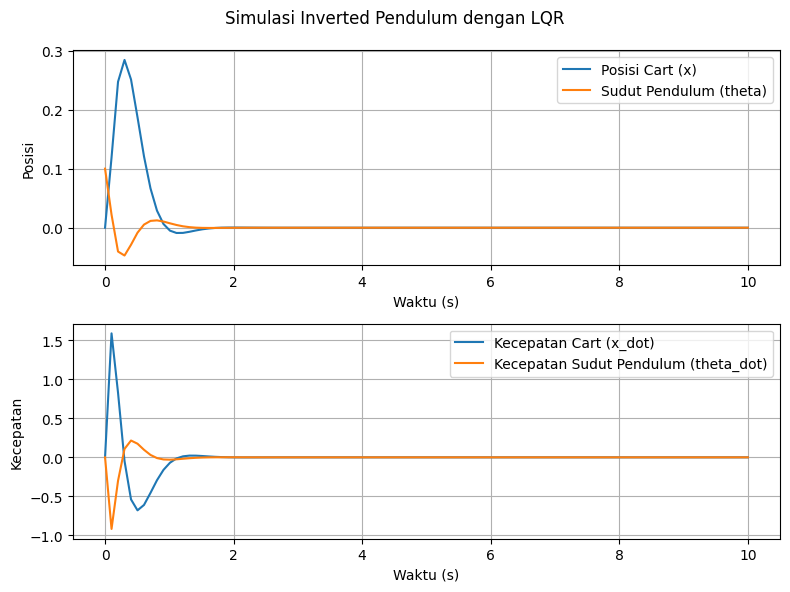

----------------------------------------------
Iteration 5
Best solution : [100.           0.1         78.53964596   0.1          7.41759796]
Best fitness : 9.473249278743573e-15


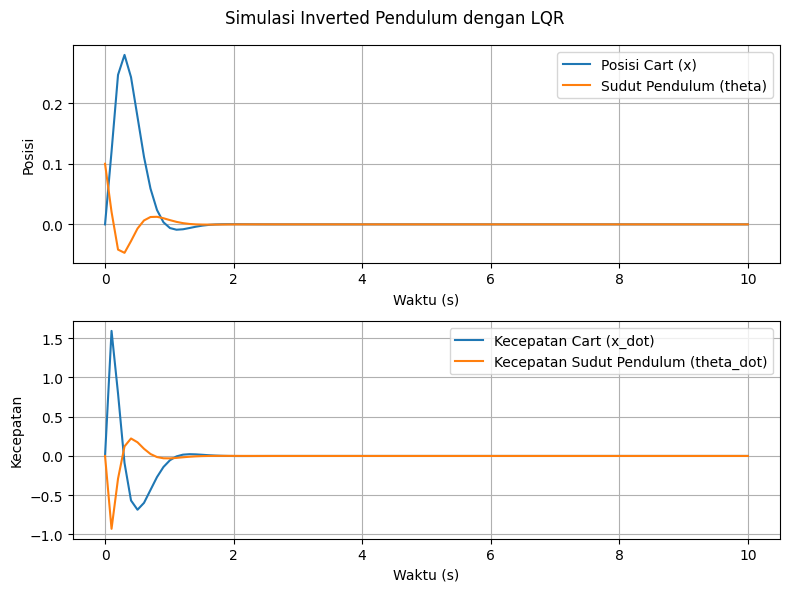

Best Q and R parameters found: [100.           0.1         78.53964596   0.1          7.41759796]
Best fitness (LQR cost): 9.473249278743573e-15


In [12]:
# @title <p> Find optimal value for Q and R

# Define bounds for optimization (example: Q diagonal entries and R value)
bounds = [(0.1, 100)] * 4 + [(0.1, 10)]  # Diagonal of Q (4 values) and scalar R (1 value)

# Initialize and run ABC optimization
abc = ABC(objective_function=objective_function, num_bees=30, max_iter=5, limit=10)
best_solution, best_fitness = abc.optimize(dim=5, bounds=bounds, verbose=True)

print("Best Q and R parameters found:", best_solution)
print("Best fitness (LQR cost):", best_fitness)

In [ ]:
# @title <p> Simulate using best solution
Q = np.diag(best_solution[:-1])
R = np.array([[best_solution[-1]]])

pendulum = InvertedPendulum(Q=Q, R=R)
pendulum_solution = pendulum.solve(t=20, t_sampling=100)

simulation = Simulation(pendulum_solution)
simulation.simulate(pendulum.L)